In [1]:
library(tidyverse)
library(reshape2)

Loading tidyverse: ggplot2
Loading tidyverse: tibble
Loading tidyverse: tidyr
Loading tidyverse: readr
Loading tidyverse: purrr
Loading tidyverse: dplyr
Conflicts with tidy packages ---------------------------------------------------
filter(): dplyr, stats
lag():    dplyr, stats

Attaching package: 'reshape2'

The following object is masked from 'package:tidyr':

    smiths



In [2]:
events_df <- read.csv('..\\..\\Data\\retailrocket\\events.csv')

In [3]:
events_df$timestamp %>% head(10)

[1] 1.433221e+12 1.433224e+12 1.433222e+12 1.433222e+12 1.433221e+12
 [6] 1.433224e+12 1.433222e+12 1.433223e+12 1.433221e+12 1.433221e+12

In [4]:
as.POSIXct(strptime('1433221332117', "%a %b %d %H:%M:%S %z %Y"))

[1] NA

In [5]:
difftime(as.POSIXct(1433221332117, origin="1970-01-01"),as.POSIXct(1433224214164, origin="1970-01-01"),units='mins')

Time difference of -48034.12 mins

In [6]:
time_diff = function(date_1,date_2,units){
    return(difftime(as.POSIXct(date_1, origin="1970-01-01"),as.POSIXct(date_2, origin="1970-01-01"),units=units) %>% as.numeric )
} 

In [7]:
events_df %>% head(20)

timestamp,visitorid,event,itemid,transactionid
1.433221e+12,257597,view,355908,NA
1.433224e+12,992329,view,248676,NA
1.433222e+12,111016,view,318965,NA
1.433222e+12,483717,view,253185,NA
1.433221e+12,951259,view,367447,NA
1.433224e+12,972639,view,22556,NA
1.433222e+12,810725,view,443030,NA
1.433223e+12,794181,view,439202,NA
1.433221e+12,824915,view,428805,NA
1.433221e+12,339335,view,82389,NA


In [8]:
events_df %>% group_by(itemid,visitorid) %>%
    summarise(vol1 = n()) %>%
    group_by(itemid) %>%
    summarise(vol = n() ) %>%
    arrange(vol %>% desc)

itemid,vol
187946,2912
5411,2079
370653,1577
461686,1393
219512,1370
96924,1359
298009,1342
335975,1154
384302,1154
151444,1103


In [9]:
events_df %>%
    group_by(visitorid) %>%
    summarise(vol = n()) %>%
arrange(vol %>% desc)

visitorid,vol
1150086,7757
530559,4328
152963,3024
895999,2474
163561,2410
371606,2345
286616,2252
684514,2246
892013,2024
861299,1991


In [10]:
events_df %>% filter(visitorid == 890980, itemid == 98491)

timestamp,visitorid,event,itemid,transactionid
1.437070e+12,890980,view,98491,NA
1.437068e+12,890980,addtocart,98491,NA
1.437069e+12,890980,addtocart,98491,NA
1.437070e+12,890980,transaction,98491,3586
1.437069e+12,890980,addtocart,98491,NA
1.437070e+12,890980,addtocart,98491,NA
1.437069e+12,890980,transaction,98491,4547
1.437069e+12,890980,transaction,98491,14069
1.437069e+12,890980,addtocart,98491,NA


In [11]:
events_df %>% filter(visitorid == 755375, itemid == 187946)

timestamp,visitorid,event,itemid,transactionid
1.435691e+12,755375,addtocart,187946,NA


In [12]:
events_df %>% select(event) %>% unique

,event
1,view
18,addtocart
131,transaction


In [13]:
events_df %>% #filter(visitorid == 890980) %>% 
    mutate(view_time = ifelse(event == 'view',timestamp,NA),
           addcart_time = ifelse(event == 'addtocart',timestamp,NA),
           transactiontime = ifelse(event == 'transaction',timestamp,NA)) %>%
 group_by(visitorid, itemid) %>%
     summarise(
         min_view = min(view_time, na.rm = T),
         min_addcart = min(addcart_time, na.rm = T),
         min_transaction = min(transactiontime, na.rm = T)
     ) %>% 
mutate( time_to_addcart = time_diff(min_view,min_addcart,'mins')) -> events_agg

In [14]:
events_agg %>% filter(!is.na(min_addcart),!is.na(min_view) ) %>% head(10)

visitorid,itemid,min_view,min_addcart,min_transaction,time_to_addcart
150,452955,1.433720e+12,1.433720e+12,NA,-1.293850e+03
172,10034,1.436849e+12,1.439600e+12,1.439602e+12,-4.584712e+07
172,465522,1.439601e+12,1.439601e+12,1.439602e+12,-7.020883e+03
177,6073,1.442290e+12,1.442290e+12,NA,-7.181500e+02
186,49029,1.439400e+12,1.439397e+12,1.439397e+12,4.512768e+04
264,161949,1.441646e+12,1.441647e+12,1.441647e+12,-2.188923e+04
264,459835,1.441647e+12,1.441647e+12,1.441647e+12,-2.631667e+01
299,149253,1.434996e+12,1.434997e+12,NA,-1.541598e+04
302,463280,1.430867e+12,1.430867e+12,NA,7.954500e+02
318,133814,1.435608e+12,1.435608e+12,NA,-1.584150e+03


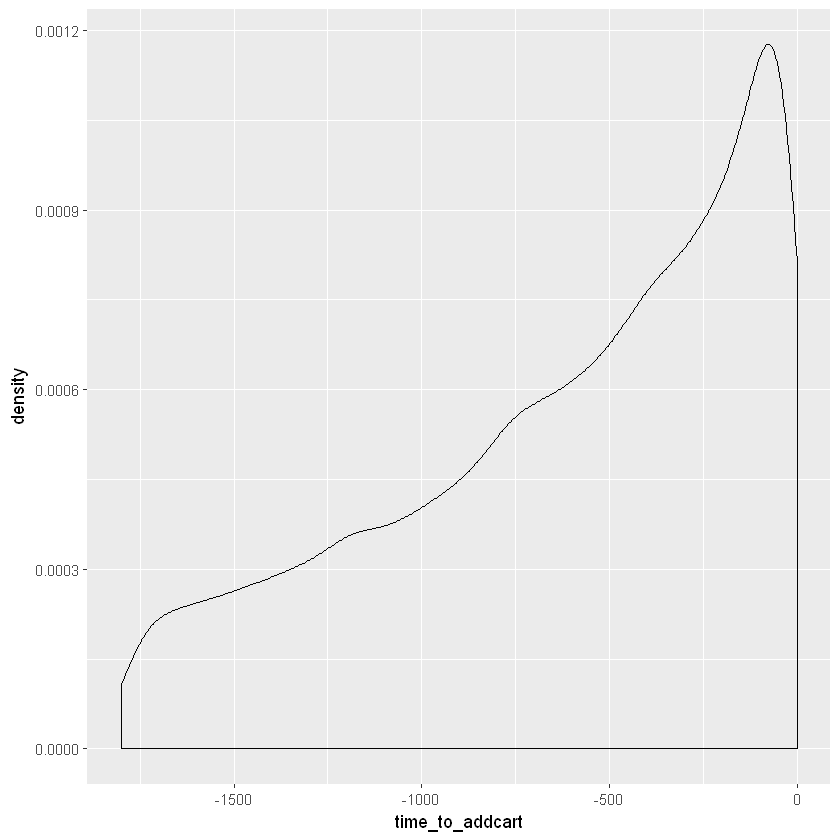

In [15]:
events_agg %>% filter(!is.na(min_addcart),!is.na(min_view) ) %>% 
filter(time_to_addcart > -1800, time_to_addcart <= 0) %>%
ggplot(aes(x = time_to_addcart)) + geom_density()

Warning message:
"Grouping rowwise data frame strips rowwise nature"Warning message:
"Removed 1 rows containing missing values (geom_point)."

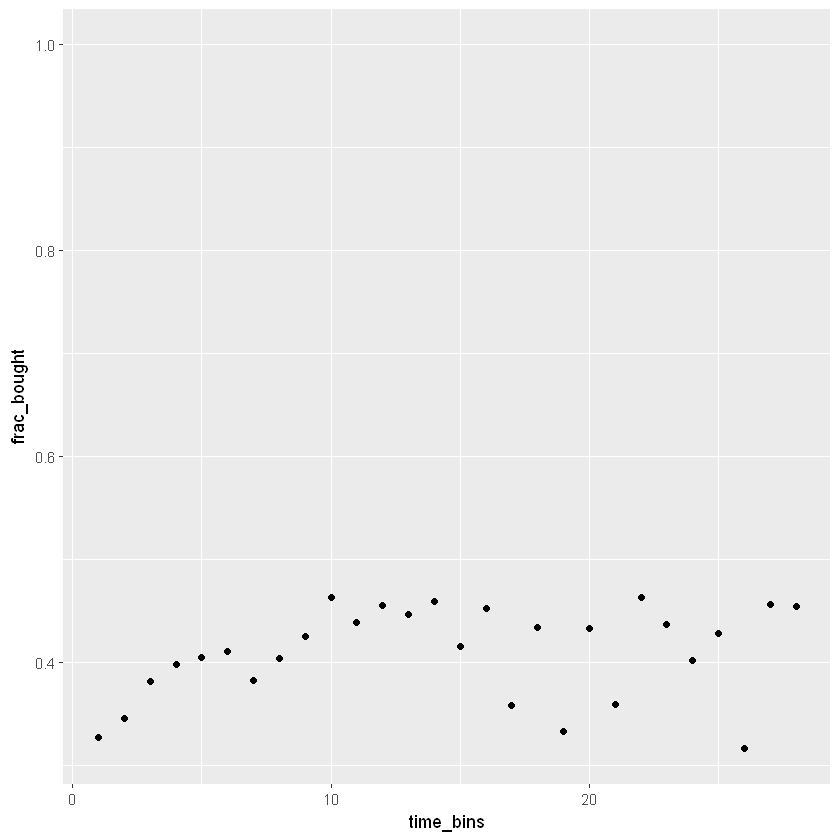

In [16]:
events_agg %>% filter(!is.na(min_addcart),!is.na(min_view) ) %>% 
filter(time_to_addcart > -40320, time_to_addcart <= 0) %>%
mutate(time_to_addcart = -1*time_to_addcart) %>%
filter(!is.na(time_to_addcart)) %>%
rowwise() %>%
mutate(time_bins = .bincode(time_to_addcart, seq(0,40320,1440), T) ) %>%
group_by(time_bins) %>%
summarise(
     vol_bought = sum(!is.na(min_transaction)),
     vol = n(),
    frac_bought = sum(!is.na(min_transaction)) / n()
 ) %>%
ggplot(aes(x = time_bins, y = frac_bought)) + geom_point()

# Looks like an interesting $ P \left( 1 - \exp( - \beta t ) \right) $ relationship

In [17]:
category_df <- read.csv('..\\..\\Data\\retailrocket\\category_tree.csv')

In [18]:
category_df %>% head(20)

categoryid,parentid
1016,213
809,169
570,9
1691,885
536,1691
231,NA
542,378
1146,542
1140,542
1479,1537


In [19]:
items_pt1 <- read.csv('..\\..\\Data\\retailrocket\\item_properties_part1.csv')
items_pt2 <- read.csv('..\\..\\Data\\retailrocket\\item_properties_part2.csv')

In [20]:
items_combined = rbind(items_pt1,items_pt2)

In [21]:
items_combined %>% tail(20)

,timestamp,itemid,property,value
20275883,1.435460e+12,10107,505,769062
20275884,1.433646e+12,187333,1066,427830 424566
20275885,1.432436e+12,392598,6,814966 945042 814966 945042 1186729
20275886,1.436065e+12,194115,42,321056
20275887,1.433646e+12,9360,987,166332 n2520.000 377738
20275888,1.435460e+12,192184,112,679677
20275889,1.434251e+12,12864,888,249879 724834 1172269
20275890,1.433041e+12,356167,available,0
20275891,1.432436e+12,206640,790,n9600.000
20275892,1.439089e+12,200211,available,0


In [22]:
items_combined$value  <- items_combined$value %>% as.character

In [23]:
items_combined %>% group_by(itemid,property) %>%
    summarise(
        vol = n(),
        num_values = n_distinct(value)
        ,max_value = max(value)
        ,min_value = min(value)
        ,time_avg = mean(timestamp)
    ) -> tmp_items_agg

In [24]:
tmp_items_agg %>% head(60)

itemid,property,vol,num_values,max_value,min_value,time_avg
0,1036,1,1,1276750,1276750,1.433646e+12
0,1056,1,1,n3.168 1144008,n3.168 1144008,1.433041e+12
0,11,1,1,n15360.000 628176 n12288.000,n15360.000 628176 n12288.000,1.433646e+12
0,112,1,1,679677,679677,1.433646e+12
0,127,1,1,1168476,1168476,1.433041e+12
0,139,1,1,n4800.000 270060 924073,n4800.000 270060 924073,1.432436e+12
0,159,1,1,519769,519769,1.431227e+12
0,177,1,1,n96.000 1206660,n96.000 1206660,1.433646e+12
0,189,1,1,708480,708480,1.435460e+12
0,202,1,1,478989,478989,1.432436e+12


In [53]:
tmp_items_agg %>% 
mutate(is_available = (property == 'available' & max_value == 1)) %>%
group_by(itemid) %>%
summarise(
    total_vol = sum(vol),
    vol_properties = n(),
    available = sum(is_available)
    #time_spread = stderr(time_avg)
) %>% head(20)

itemid,total_vol,vol_properties,available
0,45,28,0
1,86,35,1
2,24,24,0
3,46,29,0
4,42,25,0
5,29,29,0
6,78,27,1
7,33,33,0
8,23,23,0
10,29,29,0


In [ ]:
tmp_items_agg %>% dcast(., formula = itemid ~ property, value.var = 'max_value', fun.aggregate = mean) -> tmp_items_agg_vects

Warning message in mean.default(.value[0], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning message in mean.default(.value[i], ...):
"argument is not numeric or logical: returning NA"Warning me